# Electricity Demand Forecasting Using LSTM
Applied Time Series Forecasting on a National Power Grid Dataset

## 1. Business & Data Context

### Portfolio Context & Purpose

This project applies **time series forecasting** to a **real-world, large-scale operational dataset** from a national electricity transmission system. It is included in the **Sebastián Rolando data science portfolio** to demonstrate how forecasting models can support decision-making in complex infrastructure environments where demand variability directly impacts reliability, cost, and service continuity.

The focus of this notebook is to show:

* How a real business problem is translated into a forecasting task
* The value of time series modeling for operational planning
* Practical application of deep learning (LSTM) on realistic data

### Business Context

The **Power Grid Company of Bangladesh (PGCB)** operates the national electricity transmission grid with an installed capacity of approximately **25,700 MW**. As the sole national transmission operator, PGCB must continuously balance electricity supply and demand while maintaining grid stability.

Electricity demand varies significantly:

* Across hours of the day
* Between weekdays and weekends
* Across seasons and climate conditions

These variations directly affect generation scheduling, grid reliability, and the need for loadshedding during peak demand periods.

Accurate demand forecasting enables PGCB to:

* Anticipate peak demand and reduce unplanned loadshedding
* Optimize generation scheduling and resource allocation
* Maintain grid stability under high-load conditions
* Improve cost efficiency in grid operations
* Support long-term infrastructure planning decisions

### Data Context

This notebook uses the **PGCB Hourly Generation Dataset** (Bangladesh), a public dataset providing **hourly records of electricity generation, demand, and loadshedding**. It is sourced from the UCI Machine Learning Repository:

📥 **Dataset URL:** [https://archive.ics.uci.edu/dataset/1175/pgcb+hourly+generation+dataset+(bangladesh)](https://archive.ics.uci.edu/dataset/1175/pgcb+hourly+generation+dataset+%28bangladesh%29)

The dataset’s temporal granularity and historical depth make it suitable for realistic forecasting and analysis at operational scale.

This data enables:

* Identification of daily, weekly, and seasonal demand patterns
* Modeling of short- and medium-term electricity demand
* Evaluation of forecasting models under realistic constraints

### Key Data Characteristics

* **Time Series Structure**: Hourly observations spanning multiple years
* **Target Variable**: `demand_mw` (total electricity demand)
* **Generation Mix**: Detailed breakdown by generation source
* **Operational Indicators**: Loadshedding data reflecting grid stress
* **Strong Temporal Patterns**: Daily cycles, weekly trends, and seasonality

### Modeling Objective

The objective of this project is to develop an **LSTM-based time series forecasting model** to predict electricity demand (`demand_mw`). The model is designed to capture long-term dependencies and non-linear patterns in historical data to support operational planning and decision-making.

### Why LSTM?

Electricity demand exhibits strong temporal dependencies and non-linear behavior.
**Long Short-Term Memory (LSTM)** networks are well-suited for this use case because they:

* Learn long-range temporal relationships
* Capture complex seasonal and cyclical patterns
* Handle large, high-frequency time series effectively

### Expected Business Value

* Improved demand visibility for operational planning
* Reduced risk of loadshedding during peak demand periods
* More efficient generation and resource allocation
* Increased grid reliability and cost efficiency
* Clear demonstration of applied time series forecasting on real-world data

## 2. Import

In [85]:
import sys
import os
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.regularizers import l2

# my custom libraries path
MY_LIB_PATH = r"/home/seba/Documentos/Data Science Projects/seba-libs"
sys.path.append(MY_LIB_PATH)

from exploratory_data_analysis import ExploratoryDataAnalysis
from model_preparation import ModelPreparation

print("✓ All libraries imported successfully")

✓ All libraries imported successfully


In [86]:
import pandas as pd

# Cargar el Excel
df = pd.read_excel("datasets/PGCB_date_power_demand.xlsx")

# Ver las primeras filas
df.head()


,datetime,generation_mw,demand_mw,load_shedding,gas,liquid_fuel,coal,hydro,solar,wind,india_bheramara_hvdc,india_tripura,india_adani,nepal,remarks
0,2015-04-19 22:00:00,6323.0,6323,0,0,0,0,0,NaN,NaN,0,0,NaN,NaN,NaN
1,2015-04-19 21:00:00,6667.0,6667,0,0,0,0,0,NaN,NaN,0,0,NaN,NaN,NaN
2,2015-04-19 19:00:00,6897.0,6897,0,4415,1836,161,41,NaN,NaN,444,0,NaN,NaN,NaN
3,2015-04-19 18:30:00,6933.0,6933,0,4423,1862,159,45,NaN,NaN,444,0,NaN,NaN,Evening_Peak
4,2015-04-19 18:00:00,6874.0,6874,0,4319,1892,155,65,NaN,NaN,443,0,NaN,NaN,NaN


In [87]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92650 entries, 0 to 92649
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   datetime              92650 non-null  datetime64[ns]
 1   generation_mw         92650 non-null  float64       
 2   demand_mw             92650 non-null  int64         
 3   load_shedding         92650 non-null  int64         
 4   gas                   92650 non-null  int64         
 5   liquid_fuel           92650 non-null  int64         
 6   coal                  92650 non-null  int64         
 7   hydro                 92650 non-null  int64         
 8   solar                 70517 non-null  float64       
 9   wind                  18676 non-null  float64       
 10  india_bheramara_hvdc  92650 non-null  int64         
 11  india_tripura         92650 non-null  int64         
 12  india_adani           7338 non-null   float64       
 13  nepal           

In [88]:
df.describe()

,datetime,generation_mw,demand_mw,load_shedding,gas,liquid_fuel,coal,hydro,solar,wind,india_bheramara_hvdc,india_tripura,india_adani,nepal
count,92650,9.265000e+04,92650.000000,92650.000000,92650.000000,9.265000e+04,92650.000000,92650.000000,70517.000000,18676.000000,92650.000000,92650.000000,7338.000000,5351.000000
mean,2020-05-17 03:52:07.609282304,9.429376e+03,8819.646044,81.470405,5120.782914,2.038257e+03,974.349768,96.899007,46.224101,9.233133,663.169261,93.616773,881.196375,0.546814
min,2015-04-19 00:00:00,7.300000e+01,6.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2017-10-31 06:15:00,6.814775e+03,6812.250000,0.000000,4419.000000,7.200000e+02,159.000000,40.000000,0.000000,0.000000,465.000000,70.000000,702.000000,0.000000
50%,2020-05-21 15:30:00,8.412000e+03,8422.000000,0.000000,5022.000000,1.535000e+03,401.000000,79.000000,0.000000,4.000000,705.000000,97.000000,822.000000,0.000000
75%,2022-12-03 18:22:30,1.055600e+04,10633.000000,0.000000,5812.000000,2.462000e+03,1220.000000,150.000000,25.000000,13.000000,910.000000,126.000000,1050.750000,0.000000
max,2025-06-17 12:00:00,6.452650e+07,156050.000000,65359.000000,74818.000000,2.922290e+07,31687.000000,5623.000000,2998.000000,922.000000,76292.000000,1565.000000,12665.000000,38.000000
std,NaN,2.119759e+05,2772.150108,442.757182,1138.938147,9.608105e+04,1226.515481,71.442697,106.410644,16.272517,349.609395,47.483221,369.905673,4.525897


## 3. Clean Outliers

In [89]:
results_default, df_flagged = ExploratoryDataAnalysis.detect_outliers(
    df=df,
    min_unique_values=3,
    iqr_multiplier=3,
    show_exclusion_info=True)

results_default

🔍 Analyzing 12 of 13 numeric variables
⚙️  IQR Multiplier: 3 | Sigma Multiplier: 3
📊 Automatically excluded variables:
   - nepal: insufficient_unique_values (2 < 3)


,Feature,DataType,Method,Outlier Count,Outlier %,Lower Bound,Upper Bound,Min Value,Max Value,Mean,Median,Std Dev,Q1,Q3,IQR
7,solar,float64,IQR(3x),10210,11.02%,-75.00,100.00,0.0,2998.0,46.22,0.0,106.41,0.00,25.00,25.00
5,coal,int64,IQR(3x),1342,1.45%,-3024.00,4403.00,0.0,31687.0,974.35,401.0,1226.52,159.00,1220.00,1061.00
2,load_shedding,int64,3-sigma,1193,1.29%,-1246.80,1409.74,0.0,65359.0,81.47,0.0,442.76,0.00,0.00,0.00
8,wind,float64,IQR(3x),272,0.29%,-39.00,52.00,0.0,922.0,9.23,4.0,16.27,0.00,13.00,13.00
6,hydro,int64,IQR(3x),59,0.06%,-290.00,480.00,0.0,5623.0,96.90,79.0,71.44,40.00,150.00,110.00
10,india_tripura,int64,IQR(3x),50,0.05%,-98.00,294.00,0.0,1565.0,93.62,97.0,47.48,70.00,126.00,56.00
3,gas,int64,IQR(3x),48,0.05%,240.00,9991.00,0.0,74818.0,5120.78,5022.0,1138.94,4419.00,5812.00,1393.00
4,liquid_fuel,int64,IQR(3x),29,0.03%,-4506.00,7688.00,0.0,29222897.0,2038.26,1535.0,96081.05,720.00,2462.00,1742.00
9,india_bheramara_hvdc,int64,IQR(3x),17,0.02%,-870.00,2245.00,0.0,76292.0,663.17,705.0,349.61,465.00,910.00,445.00
1,demand_mw,int64,IQR(3x),8,0.01%,-4650.00,22095.25,6.0,156050.0,8819.65,8422.0,2772.15,6812.25,10633.00,3820.75


- generation_mw

In [90]:
# Clean a big outlier of 64526500.0 value in generation_mw
df = df[df["generation_mw"] < 60_000_000]


In [91]:
import plotly.express as px

fig = px.scatter(
    df,
    x="datetime",
    y="generation_mw",
    title="Generation (MW) over Time",
    opacity=0.7,
    height=600,
)

# Add dynamic range slider
fig.update_xaxes(rangeslider_visible=True)

fig.show()

In [92]:
# Exclude all columns except demand_mw
all_numeric = df.select_dtypes(include=['int64', 'int32', 'float64', 'float32']).columns.tolist()
exclude_cols = [col for col in all_numeric if col != 'demand_mw']

results_default, df_flagged = ExploratoryDataAnalysis.detect_outliers(
    df=df,
    exclude_columns=exclude_cols,  # Only analyze demand_mw
    min_unique_values=3,
    iqr_multiplier=3,
    show_exclusion_info=True
)



🔍 Analyzing 1 of 1 numeric variables
⚙️  IQR Multiplier: 3 | Sigma Multiplier: 3
✅ No variables were automatically excluded


In [93]:

# Convert is_outlier to categorical for better legend labels
df_flagged['outlier_label'] = df_flagged['is_outlier'].map({
    0: 'Normal',
    1: 'Outlier'
})

# Create scatter plot with color based on outlier status
fig = px.scatter(
    data_frame=df_flagged,
    x="datetime",
    y="demand_mw",
    color="outlier_label",  # Color by outlier status
    title="Demand (MW) over Time - Outliers Highlighted (IRQ > 3)",
    opacity=0.7,
    height=600,
    color_discrete_map={
        'Normal': '#1f77b4',    # Blue for normal points
        'Outlier': '#d62728'    # Red for outliers
    },
    labels={'outlier_label': 'Status'}  # Legend title
)

# Add dynamic range slider
fig.update_xaxes(rangeslider_visible=True)

# Optional: Customize marker size for better visibility
fig.update_traces(marker=dict(size=6))

fig.show()

**Inferences**  
These outliers cannot be attributed to electrical faults such as short circuits. Since the dataset contains hourly averages, a transient event lasting only seconds cannot increase the measured load by a factor of 3–8, so these values are data errors and will be removed.

In [94]:
df_flagged.loc[df_flagged['is_outlier'] == 1, ['generation_mw', 'is_outlier']]




,generation_mw,is_outlier
18997,7423.0,1
21510,8068.0,1
33392,5563.9,1
71222,10052.0,1
72872,15172.0,1
77286,11468.0,1
81981,11701.0,1
83933,11080.0,1


In [95]:
def drop_rows_by_index(df, index_to_drop):
    """
    Elimina filas de un DataFrame según un índice provisto.
    
    Parameters
    ----------
    df : pd.DataFrame
        DataFrame original.
    index_to_drop : array-like, pd.Index
        Índices de las filas a eliminar.
    
    Returns
    -------
    pd.DataFrame
        DataFrame sin las filas especificadas.
    """
    return df.drop(index=index_to_drop, errors='ignore')

outlier_index = df_flagged.loc[df_flagged['is_outlier'] == 1].index

df_clean = drop_rows_by_index(df_flagged, outlier_index)


In [96]:

# Convert is_outlier to categorical for better legend labels
df_flagged['outlier_label'] = df_flagged['is_outlier'].map({
    0: 'Normal',
    1: 'Outlier'
})

# Create scatter plot with color based on outlier status
fig = px.scatter(
    data_frame=df_clean,
    x="datetime",
    y="demand_mw",
    color="outlier_label",  # Color by outlier status
    title="Demand (MW) over Time - Without Outliers (IRQ > 3)",
    opacity=0.7,
    height=600,
    color_discrete_map={
        'Normal': '#1f77b4',    # Blue for normal points
        'Outlier': '#d62728'    # Red for outliers
    },
    labels={'outlier_label': 'Status'}  # Legend title
)

# Add dynamic range slider
fig.update_xaxes(rangeslider_visible=True)

# Optional: Customize marker size for better visibility
fig.update_traces(marker=dict(size=6))

fig.show()

## 4. Feature Ingineering

In [97]:
#TODO: improve the model adding extra feature related to a temporal line

In [98]:

# print("\n" + "="*70)
# print("ADDING TIME-BASED FEATURES")
# print("="*70)

# # Convert datetime to datetime object if not already
# df_flagged['datetime'] = pd.to_datetime(df_flagged['datetime'])

# # Add cyclical time features
# df_flagged['hour_sin'] = np.sin(2 * np.pi * df_flagged['datetime'].dt.hour / 24)
# df_flagged['hour_cos'] = np.cos(2 * np.pi * df_flagged['datetime'].dt.hour / 24)
# df_flagged['dayofweek_sin'] = np.sin(2 * np.pi * df_flagged['datetime'].dt.dayofweek / 7)
# df_flagged['dayofweek_cos'] = np.cos(2 * np.pi * df_flagged['datetime'].dt.dayofweek / 7)
# df_flagged['month_sin'] = np.sin(2 * np.pi * df_flagged['datetime'].dt.month / 12)
# df_flagged['month_cos'] = np.cos(2 * np.pi * df_flagged['datetime'].dt.month / 12)

# # Add lag features (careful not to create lookahead bias!)
# df_flagged['demand_lag_24h'] = df_flagged['demand_mw'].shift(24)
# df_flagged['demand_lag_168h'] = df_flagged['demand_mw'].shift(168)

# # Add rolling statistics (use forward-fill to avoid lookahead)
# df_flagged['demand_7d_avg'] = df_flagged['demand_mw'].rolling(window=168, min_periods=1).mean()
# df_flagged['demand_7d_std'] = df_flagged['demand_mw'].rolling(window=168, min_periods=1).std()

# # Fill NaN values for lag and rolling features
# df_flagged['demand_lag_24h'].fillna(method='bfill', inplace=True)
# df_flagged['demand_lag_168h'].fillna(method='bfill', inplace=True)
# df_flagged['demand_7d_avg'].fillna(method='bfill', inplace=True)
# df_flagged['demand_7d_std'].fillna(method='bfill', inplace=True)

# print(f"✓ Added {len([c for c in df_flagged.columns if '_sin' in c or '_cos' in c or 'lag' in c or 'avg' in c])} new features")
# print("="*70)

## 5. Configure data for LTSM Training

In [99]:
"""
CONFIGURATION FOR REAL TIME SERIES DATA

KEY PARAMETERS EXPLAINED:

1. SEQUENCE_LENGTH (Input Window):
   - How many past time steps the LSTM uses to predict the NEXT value
   - For electricity demand with hourly data:
     * 24 = 1 day of history
     * 168 = 1 week (captures weekly patterns)
     * 336 = 2 weeks (captures longer cycles)
   - Rule: Should cover at least one complete cycle of your pattern
   - YOUR DATA: 168-336 recommended (weekly + daily patterns)

2. PREDICTION_POINTS (Visualization Only):
   - How many predictions to show in plots
   - Does NOT affect model training
   - Can be any value from 1 to len(test_set)
   - Recommendation: 168-336 (1-2 weeks) for clear visualization

3. TEST_SIZE:
   - Proportion of data for testing
   - With 92k samples: 15% = ~14k test samples (plenty!)
   - More data for training = better model

4. Model Architecture:
   - LSTM_UNITS: Neurons per layer (128→64→32 for deep learning)
   - DROPOUT_RATE: Regularization (0.2 = drop 20% of neurons)
   - Higher values = more capacity but risk overfitting

5. Training Parameters:
   - EPOCHS: Maximum training iterations (early stopping prevents overfitting)
   - BATCH_SIZE: Samples per update (larger = faster, smoother training)
   - LEARNING_RATE: Step size for optimization (lower = more stable)

6. Data Preprocessing:
   - SCALE_DATA: MUST be True for real data with large ranges!
   - SCALER_TYPE: 'minmax' (0-1) or 'standard' (mean=0, std=1)

7. Model Persistence:
   - MODEL_PATH: Where to save/load the trained model
   - OVERWRITE_MODEL: If False and model exists, skip training

"""

# ============================================================================
# CONFIGURATION FOR YOUR ELECTRICITY DEMAND DATA
# ============================================================================

# Data Preprocessing
SCALE_DATA = True              # CRITICAL: Scale data before training
SCALER_TYPE = 'StandardScaler'         # Options: 'minmax' or 'standard'

# Model Input/Output Configuration
SEQUENCE_LENGTH = 168          # Look back 1 week (168 hours) to predict next hour
                              # Captures weekly patterns + daily cycles

PREDICTION_POINTS = 336        # Visualize 2 weeks (336 hours) of predictions
                              # Only affects plots, not training

TEST_SIZE = 0.20              # Use 15% for testing (~14k samples)
                              # Leaves 85% (~78k samples) for training

# Model Architecture
LSTM_UNITS_1 = 128            # First LSTM layer: 128 neurons
LSTM_UNITS_2 = 64             # Second LSTM layer: 64 neurons  
LSTM_UNITS_3 = 32             # Third LSTM layer: 32 neurons (deep architecture)
DROPOUT_RATE = 0.2            # Drop 20% of neurons during training. 

# Training Configuration
EPOCHS = 50                  # Maximum epochs (early stopping may stop sooner) / 50
BATCH_SIZE = 64               # Process 64 samples at a time / 64
LEARNING_RATE = 0.001        # Learning rate for Adam optimizer / 0.0003



# Model Persistence Configuration
MODEL_PATH = './model/best_lstm_model.keras'  # Path to save/load model
OVERWRITE_MODEL = False       # Set to True to retrain even if model exists
                             # Set to False to skip training if model exists

# ============================================================================
# Display Configuration Summary
# ============================================================================
print("="*70)
print("LSTM CONFIGURATION FOR ELECTRICITY DEMAND FORECASTING")
print("="*70)
print(f"Data Preprocessing:")
print(f"  • Scaling:          {SCALE_DATA} ({SCALER_TYPE})")
print(f"  • Test Split:       {TEST_SIZE:.1%} (~14k samples for testing)")
print()
print(f"Model Configuration:")
print(f"  • Sequence Length:  {SEQUENCE_LENGTH} hours (1 week history)")
print(f"  • Architecture:     3-layer LSTM ({LSTM_UNITS_1}→{LSTM_UNITS_2}→{LSTM_UNITS_3})")
print(f"  • Dropout:          {DROPOUT_RATE:.1%} regularization")
print(f"  • Regularization:   L2 (0.001) + Batch Normalization")
print()
print(f"Training Settings:")
print(f"  • Max Epochs:       {EPOCHS}")
print(f"  • Batch Size:       {BATCH_SIZE}")
print(f"  • Learning Rate:    {LEARNING_RATE}")
print(f"  • Early Stopping:   Enabled (patience=10)")
print()
print(f"Model Persistence:")
print(f"  • Model Path:       {MODEL_PATH}")
print(f"  • Overwrite Model:  {OVERWRITE_MODEL}")
print()
print(f"Visualization:")
print(f"  • Display Points:   {PREDICTION_POINTS} hours (~2 weeks)")
print("="*70)
print()
print("📊 Expected Performance Targets:")
print("   • MAPE < 5%:  Excellent (production ready)")
print("   • MAPE < 10%: Good (acceptable)")
print("   • MAPE < 15%: Fair (needs improvement)")
print("="*70)

LSTM CONFIGURATION FOR ELECTRICITY DEMAND FORECASTING
Data Preprocessing:
  • Scaling:          True (StandardScaler)
  • Test Split:       20.0% (~14k samples for testing)

Model Configuration:
  • Sequence Length:  168 hours (1 week history)
  • Architecture:     3-layer LSTM (128→64→32)
  • Dropout:          20.0% regularization
  • Regularization:   L2 (0.001) + Batch Normalization

Training Settings:
  • Max Epochs:       50
  • Batch Size:       64
  • Learning Rate:    0.001
  • Early Stopping:   Enabled (patience=10)

Model Persistence:
  • Model Path:       ./model/best_lstm_model.keras
  • Overwrite Model:  False

Visualization:
  • Display Points:   336 hours (~2 weeks)

📊 Expected Performance Targets:
   • MAPE < 5%:  Excellent (production ready)
   • MAPE < 10%: Good (acceptable)
   • MAPE < 15%: Fair (needs improvement)


## 6. Verify temporal input data

In [100]:
df_flagged

,datetime,generation_mw,demand_mw,load_shedding,gas,liquid_fuel,coal,hydro,solar,wind,india_bheramara_hvdc,india_tripura,india_adani,nepal,remarks,is_outlier,outlier_label
0,2015-04-19 22:00:00,6323.0,6323,0,0,0,0,0,NaN,NaN,0,0,NaN,NaN,NaN,0,Normal
1,2015-04-19 21:00:00,6667.0,6667,0,0,0,0,0,NaN,NaN,0,0,NaN,NaN,NaN,0,Normal
2,2015-04-19 19:00:00,6897.0,6897,0,4415,1836,161,41,NaN,NaN,444,0,NaN,NaN,NaN,0,Normal
3,2015-04-19 18:30:00,6933.0,6933,0,4423,1862,159,45,NaN,NaN,444,0,NaN,NaN,Evening_Peak,0,Normal
4,2015-04-19 18:00:00,6874.0,6874,0,4319,1892,155,65,NaN,NaN,443,0,NaN,NaN,NaN,0,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92645,2025-06-17 04:00:00,12698.0,12698,0,6030,834,3610,172,0.0,42.0,924,38,1010.0,38.0,NaN,0,Normal
92646,2025-06-17 03:00:00,13280.0,13280,0,6347,999,3698,172,0.0,40.0,924,38,1024.0,38.0,NaN,0,Normal
92647,2025-06-17 02:00:00,13719.0,13719,0,6340,1196,3881,172,0.0,27.0,924,36,1105.0,38.0,NaN,0,Normal
92648,2025-06-17 01:00:00,14093.0,14115,21,6323,1350,4019,172,0.0,28.0,924,38,1201.0,38.0,NaN,0,Normal


In [101]:
"""
THIS BLOCK VERIFIES YOUR REAL DATA IS READY

REQUIREMENTS:
- Variable 'unified_df' must exist with your electricity demand data
- Must have a column named 'target' with the demand values (MW)
- Data should be in chronological order (time series)
"""

# Store data in wave_df for consistency with rest of code
wave_df = pd.DataFrame()
wave_df['target'] = df_flagged['demand_mw'].copy()


# Data validation
print("="*70)
print("✓ REAL DATA LOADED SUCCESSFULLY")
print("="*70)
print(f"Data Overview:")
print(f"  • Total samples:     {len(wave_df):,}")
print(f"  • Shape:             {wave_df.shape}")
print(f"  • Columns:           {wave_df.columns.tolist()}")
print()
print(f"Value Statistics (MW):")
print(f"  • Minimum:           {wave_df['target'].min():,.2f} MW")
print(f"  • Maximum:           {wave_df['target'].max():,.2f} MW")
print(f"  • Mean:              {wave_df['target'].mean():,.2f} MW")
print(f"  • Median:            {wave_df['target'].median():,.2f} MW")
print(f"  • Std Deviation:     {wave_df['target'].std():,.2f} MW")
print(f"  • Range:             {wave_df['target'].max() - wave_df['target'].min():,.2f} MW")
print()
print(f"Data Quality:")
print(f"  • Missing values:    {wave_df['target'].isna().sum()} ({wave_df['target'].isna().sum()/len(wave_df)*100:.2f}%)")
print(f"  • Zero values:       {(wave_df['target'] == 0).sum()} ({(wave_df['target'] == 0).sum()/len(wave_df)*100:.2f}%)")
print(f"  • Negative values:   {(wave_df['target'] < 0).sum()}")
print("="*70)

# Check for data issues
if wave_df['target'].isna().sum() > 0:
    print("\n⚠️  WARNING: Missing values detected!")
    print("   Consider filling or removing missing values before training")

if (wave_df['target'] < 0).any():
    print("\n⚠️  WARNING: Negative demand values detected!")
    print("   This might indicate data quality issues")

if wave_df['target'].std() == 0:
    print("\n❌ ERROR: All values are the same! Cannot train model.")
else:
    print("\n✓ Data ready for preprocessing and training")

✓ REAL DATA LOADED SUCCESSFULLY
Data Overview:
  • Total samples:     92,649
  • Shape:             (92649, 1)
  • Columns:           ['target']

Value Statistics (MW):
  • Minimum:           6.00 MW
  • Maximum:           156,050.00 MW
  • Mean:              8,819.67 MW
  • Median:            8,422.00 MW
  • Std Deviation:     2,772.15 MW
  • Range:             156,044.00 MW

Data Quality:
  • Missing values:    0 (0.00%)
  • Zero values:       0 (0.00%)
  • Negative values:   0

✓ Data ready for preprocessing and training


In [102]:
import pandas as pd
from typing import Tuple, Dict, Any

def validate_time_series_data(
    data: pd.DataFrame, 
    value_column: str,
    output_column: str = 'target',
    verbose: bool = True
) -> Tuple[pd.DataFrame, Dict[str, Any]]:
    """
    Validate time series data for machine learning projects.
    
    Parameters:
    -----------
    data : pd.DataFrame
        Input dataframe containing time series data
    value_column : str
        Name of the column containing the time series values
    output_column : str, default='target'
        Name of the output column in the returned dataframe  
    verbose : bool, default=True
        Whether to print detailed validation information
    
    Returns:
    --------
    Tuple[pd.DataFrame, Dict[str, Any]]
        - processed_df: Processed dataframe with standardized column name
        - validation_stats: Dictionary containing comprehensive data statistics and quality metrics
    
    Raises:
    -------
    ValueError: If required columns are missing or data has critical issues
    """
    
    # Input validation
    if value_column not in data.columns:
        raise ValueError(f"Value column '{value_column}' not found in dataframe. Available columns: {list(data.columns)}")
    
    if data.empty:
        raise ValueError("Input dataframe is empty")
    
    # Initialize output dataframe
    processed_df = pd.DataFrame()
    processed_df[output_column] = data[value_column].copy()
    
    # Calculate comprehensive statistics
    validation_stats = {
        'total_samples': len(processed_df),
        'data_shape': processed_df.shape,
        'data_columns': processed_df.columns.tolist(),
        'value_statistics': {
            'min': processed_df[output_column].min(),
            'max': processed_df[output_column].max(),
            'mean': processed_df[output_column].mean(),
            'median': processed_df[output_column].median(),
            'std': processed_df[output_column].std(),
            'range': processed_df[output_column].max() - processed_df[output_column].min(),
            'variance': processed_df[output_column].var()
        },
        'data_quality': {
            'missing_count': processed_df[output_column].isna().sum(),
            'missing_percentage': processed_df[output_column].isna().sum() / len(processed_df) * 100,
            'zero_count': (processed_df[output_column] == 0).sum(),
            'zero_percentage': (processed_df[output_column] == 0).sum() / len(processed_df) * 100,
            'negative_count': (processed_df[output_column] < 0).sum(),
            'infinite_count': np.isinf(processed_df[output_column]).sum() if hasattr(processed_df[output_column], 'dtype') and np.issubdtype(processed_df[output_column].dtype, np.number) else 0
        },
        'validation_flags': {
            'has_missing_values': processed_df[output_column].isna().sum() > 0,
            'has_negative_values': (processed_df[output_column] < 0).any(),
            'has_zero_values': (processed_df[output_column] == 0).any(),
            'has_infinite_values': np.isinf(processed_df[output_column]).any() if hasattr(processed_df[output_column], 'dtype') and np.issubdtype(processed_df[output_column].dtype, np.number) else False,
            'is_constant_series': processed_df[output_column].std() == 0,
            'is_empty_series': len(processed_df) == 0,
            'is_ready_for_training': processed_df[output_column].std() != 0 and not processed_df[output_column].isna().all()
        }
    }
    
    if verbose:
        _print_validation_summary(processed_df, output_column, validation_stats)
    
    # Check for critical data issues
    if validation_stats['validation_flags']['is_constant_series']:
        raise ValueError("All time series values are identical - cannot train meaningful models")
    
    if validation_stats['validation_flags']['is_empty_series']:
        raise ValueError("Time series data is empty")
    
    if validation_stats['data_quality']['missing_count'] == len(processed_df):
        raise ValueError("All time series values are missing")
    
    return processed_df, validation_stats


def _print_validation_summary(processed_df: pd.DataFrame, output_column: str, stats: Dict[str, Any]) -> None:
    """Print formatted time series validation summary."""
    
    print("=" * 70)
    print("📊 TIME SERIES DATA VALIDATION REPORT")
    print("=" * 70)
    
    print("DATA OVERVIEW:")
    print(f"  • Total observations: {stats['total_samples']:,}")
    print(f"  • Data shape:         {stats['data_shape']}")
    print(f"  • Data columns:       {stats['data_columns']}")
    
    print("\nVALUE STATISTICS:")
    vals = stats['value_statistics']
    print(f"  • Minimum:            {vals['min']:,.4f}")
    print(f"  • Maximum:            {vals['max']:,.4f}")
    print(f"  • Mean:               {vals['mean']:,.4f}")
    print(f"  • Median:             {vals['median']:,.4f}")
    print(f"  • Std Deviation:      {vals['std']:,.4f}")
    print(f"  • Variance:           {vals['variance']:,.4f}")
    print(f"  • Value Range:        {vals['range']:,.4f}")
    
    print("\nDATA QUALITY ASSESSMENT:")
    quality = stats['data_quality']
    print(f"  • Missing values:     {quality['missing_count']} ({quality['missing_percentage']:.2f}%)")
    print(f"  • Zero values:        {quality['zero_count']} ({quality['zero_percentage']:.2f}%)")
    print(f"  • Negative values:    {quality['negative_count']}")
    if quality['infinite_count'] > 0:
        print(f"  • Infinite values:    {quality['infinite_count']}")
    
    print("\nVALIDATION STATUS:")
    flags = stats['validation_flags']
    status_icons = {True: "❌", False: "✅"}
    print(f"  • Missing values:     {status_icons[flags['has_missing_values']]}")
    print(f"  • Negative values:    {status_icons[flags['has_negative_values']]}")
    print(f"  • Zero values:        {status_icons[flags['has_zero_values']]}")
    print(f"  • Infinite values:    {status_icons[flags['has_infinite_values']]}")
    print(f"  • Constant series:    {status_icons[flags['is_constant_series']]}")
    
    print("=" * 70)
    
    # Generate actionable warnings
    warnings = []
    if flags['has_missing_values']:
        warnings.append("Missing values detected - consider imputation or removal")
    
    if flags['has_negative_values']:
        warnings.append("Negative values present - verify if this is expected for your use case")
    
    if flags['has_infinite_values']:
        warnings.append("Infinite values found - these may cause numerical instability")
    
    if flags['is_constant_series']:
        warnings.append("Constant time series - no variability for model learning")
    
    if warnings:
        print("\n⚠️  DATA QUALITY WARNINGS:")
        for i, warning in enumerate(warnings, 1):
            print(f"   {i}. {warning}")
    
    # Final readiness assessment
    if flags['is_ready_for_training']:
        print("\n✅ DATA READY FOR TIME SERIES MODELING")
    else:
        print("\n❌ DATA REQUIRES PREPROCESSING BEFORE MODELING")


# Optional: Add numpy import at the top if using infinite value checks
import numpy as np

In [103]:
wave_df, stats = validate_time_series_data(
    data=df_flagged,
    value_column='demand_mw', 
    output_column='target',
    verbose=True
)

📊 TIME SERIES DATA VALIDATION REPORT
DATA OVERVIEW:
  • Total observations: 92,649
  • Data shape:         (92649, 1)
  • Data columns:       ['target']

VALUE STATISTICS:
  • Minimum:            6.0000
  • Maximum:            156,050.0000
  • Mean:               8,819.6716
  • Median:             8,422.0000
  • Std Deviation:      2,772.1542
  • Variance:           7,684,838.6603
  • Value Range:        156,044.0000

DATA QUALITY ASSESSMENT:
  • Missing values:     0 (0.00%)
  • Zero values:        0 (0.00%)
  • Negative values:    0

VALIDATION STATUS:
  • Missing values:     ✅
  • Negative values:    ✅
  • Zero values:        ✅
  • Infinite values:    ✅
  • Constant series:    ✅

✅ DATA READY FOR TIME SERIES MODELING


## 7. Train-Test Split

In [104]:
X_train, X_test, y_train, y_test = ModelPreparation.temporal_train_test_split(
    unified_df=wave_df,  # Use unscaled
    target_col='target',
    test_size=TEST_SIZE
)

print("\n✓ Data split completed (BEFORE scaling)")

Shape of X_train: (74119, 0)
Shape of X_test: (18530, 0)
Shape of y_train: (74119,)
Shape of y_test: (18530,)

✓ Data split completed (BEFORE scaling)


## 8. Scaling


SCALING - after data split FOR NO DATA LEAKAGE

In [105]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import joblib
import os

# Create models directory
model_dir = './model'
os.makedirs(model_dir, exist_ok=True)

print("\nORIGINAL DATA STATISTICS (TRAINING SET):")
print(f"  Min:  {y_train.min():.2f}")
print(f"  Max:  {y_train.max():.2f}")
print(f"  Mean: {y_train.mean():.2f}")
print(f"  Std:  {y_train.std():.2f}")

# Initialize scaler - FIT ONLY ON TRAINING DATA
if SCALE_DATA:
    if SCALER_TYPE == 'minmax':
        scaler = MinMaxScaler(feature_range=(0, 1))
        print(f"\n✓ Applying MinMaxScaler (0-1 range)")
    else:
        scaler = StandardScaler()
        print(f"\n✓ Applying StandardScaler (mean=0, std=1)")

    # CREATE new scaled versions with explicit naming
    y_train_scaled = scaler.fit_transform(y_train.values.reshape(-1, 1)).flatten()
    y_test_scaled = scaler.transform(y_test.values.reshape(-1, 1)).flatten()

    # For consistency (even though X=y in univariate case)
    X_train_scaled = y_train_scaled.copy()
    X_test_scaled = y_test_scaled.copy()
    

    # SAVE THE SCALER FOR FUTURE USE
    scaler_path = os.path.join(model_dir, 'scaler.pkl')
    joblib.dump(scaler, scaler_path)
    print(f"✓ Scaler saved to: {scaler_path}")
    
    print("\nSCALED DATA STATISTICS:")
    print(f"  Training Min:  {y_train_scaled.min():.4f}")
    print(f"  Training Max:  {y_train_scaled.max():.4f}")
    print(f"  Training Mean: {y_train_scaled.mean():.4f}")
    print(f"  Training Std:  {y_train_scaled.std():.4f}")
    
else:
    scaler = None
    y_train_scaled = y_train.values  # Keep as numpy array
    y_test_scaled = y_test.values
    print("\n⚠️  WARNING: Data not scaled - may cause training issues!")

print(f"\n✓ Data scaling completed")
print(f"  y_train_scaled: {type(y_train_scaled).__name__} with shape {y_train_scaled.shape}")
print(f"  y_test_scaled:  {type(y_test_scaled).__name__} with shape {y_test_scaled.shape}")


ORIGINAL DATA STATISTICS (TRAINING SET):
  Min:  6.00
  Max:  156050.00
  Mean: 8158.23
  Std:  2366.67

✓ Applying StandardScaler (mean=0, std=1)
✓ Scaler saved to: ./model/scaler.pkl

SCALED DATA STATISTICS:
  Training Min:  -3.4446
  Training Max:  62.4899
  Training Mean: 0.0000
  Training Std:  1.0000

✓ Data scaling completed
  y_train_scaled: ndarray with shape (74119,)
  y_test_scaled:  ndarray with shape (18530,)


## 9. Windowed Squences

Create Windowed Sequences (From Scaled Data)

In [106]:
# Prepare scaled data for sequence creation
# Note: For univariate forecasting, both X and y come from the same scaled series
X_train_for_seq = pd.DataFrame(X_train_scaled.reshape(-1, 1), columns=['signal'])
X_test_for_seq = pd.DataFrame(X_test_scaled.reshape(-1, 1), columns=['signal'])
y_train_for_seq = pd.Series(y_train_scaled, name='target')
y_test_for_seq = pd.Series(y_test_scaled, name='target')

# Create sequences (these will be SCALED sequences)
X_train_seq_scaled, X_test_seq_scaled, y_train_seq_scaled, y_test_seq_scaled = ModelPreparation.create_window_sequences(
    X_train=X_train_for_seq,
    X_test=X_test_for_seq,
    y_train=y_train_for_seq,
    y_test=y_test_for_seq,
    seq_length=SEQUENCE_LENGTH
)

print("\n✓ Sequences created successfully (SCALED)")
print(f"  X_train_seq_scaled shape: {X_train_seq_scaled.shape}")
print(f"  y_train_seq_scaled shape: {y_train_seq_scaled.shape}")
print(f"  Note: All sequences contain SCALED data and will need inverse transform for evaluation")

Shape of X_train_seq: (73951, 168, 1)
Shape of X_test_seq: (18362, 168, 1)
Shape of y_train_seq: (73951,)
Shape of y_test_seq: (18362,)

✓ Sequences created successfully (SCALED)
  X_train_seq_scaled shape: (73951, 168, 1)
  y_train_seq_scaled shape: (73951,)
  Note: All sequences contain SCALED data and will need inverse transform for evaluation


## 10. Build LSTM model

In [107]:
"""
ARCHITECTURE IMPROVEMENTS FOR REAL DATA:

1. Deeper network: 3 LSTM layers instead of 2
   - More capacity to learn complex patterns
   - Better for large datasets (92k samples)

2. Batch Normalization:
   - Helps with gradient flow
   - Faster, more stable training
   
3. L2 Regularization:
   - Prevents overfitting
   - Important for complex models
"""

from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.regularizers import l2

model = Sequential([
    # First LSTM layer
    LSTM(LSTM_UNITS_1, 
         return_sequences=True, 
         input_shape=(SEQUENCE_LENGTH, X_train_seq_scaled.shape[2]),
         kernel_regularizer=l2(0.001)),  # L2 regularization
    BatchNormalization(),
    Dropout(DROPOUT_RATE),
    
    # Second LSTM layer
    LSTM(LSTM_UNITS_2, 
         return_sequences=True,
         kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    Dropout(DROPOUT_RATE),
    
    # Third LSTM layer
    LSTM(LSTM_UNITS_3, 
         return_sequences=False,
         kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    Dropout(DROPOUT_RATE),
    
    # Dense output layer
    Dense(1)
])

# Compilación
optimizer = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])

print("Modelo simplificado construido exitosamente.")

# Compile with custom learning rate and gradient clipping
from tensorflow.keras.optimizers import Adam

optimizer = Adam(
    learning_rate=LEARNING_RATE,
    clipnorm=1.0  # Gradient clipping prevents exploding gradients
)

model.compile(
    optimizer=optimizer,
    loss='mse',
    metrics=['mae', 'mape']  # Added MAPE for percentage error
)

print("\n" + "="*70)
print("IMPROVED LSTM MODEL")
print("="*70)
print(f"Architecture:")
print(f"  - Input shape: ({SEQUENCE_LENGTH}, {X_train_seq_scaled.shape[2]})")
print(f"  - 3 LSTM layers: {LSTM_UNITS_1} → {LSTM_UNITS_2} → {LSTM_UNITS_3}")
print(f"  - Batch Normalization: After each LSTM")
print(f"  - L2 Regularization: 0.001")
print(f"  - Dropout: {DROPOUT_RATE}")
print(f"  - Gradient Clipping: 1.0")
print(f"  - Total parameters: {model.count_params():,}")
print("="*70)
model.summary()


Modelo simplificado construido exitosamente.

IMPROVED LSTM MODEL
Architecture:
  - Input shape: (168, 1)
  - 3 LSTM layers: 128 → 64 → 32
  - Batch Normalization: After each LSTM
  - L2 Regularization: 0.001
  - Dropout: 0.2
  - Gradient Clipping: 1.0
  - Total parameters: 129,313


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_12 (LSTM)                  │ (None, 168, 128)       │        66,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 168, 128)       │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 168, 128)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_13 (LSTM)                  │ (None, 168, 64)        │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 168, 64)        │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 168, 64)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_14 (LSTM)                  │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 129,313 (505.13 KB)

 Trainable params: 128,865 (503.38 KB)

 Non-trainable params: 448 (1.75 KB)

## 11. Train Model using Callbacks

Train with advanced callbacks (or load existing model if OVERWRITE_MODEL = False)

In [108]:

# ============================================================================
# BLOCK 8: TRAIN WITH ADVANCED CALLBACKS (OR LOAD EXISTING MODEL)
# ============================================================================
"""
SMART TRAINING STRATEGY:

1. Check if trained model already exists
2. If exists and OVERWRITE_MODEL=False → Load existing model, skip training
3. If not exists or OVERWRITE_MODEL=True → Train new model

This saves time when re-running notebooks and prevents accidental retraining.
"""

from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import load_model

# Check if model already exists
model_exists = os.path.exists(MODEL_PATH)

if model_exists and not OVERWRITE_MODEL:
    # ========================================================================
    # LOAD EXISTING MODEL
    # ========================================================================
    print("\n" + "="*70)
    print("📂 LOADING EXISTING MODEL")
    print("="*70)
    print(f"Model found at: {MODEL_PATH}")
    print(f"OVERWRITE_MODEL = {OVERWRITE_MODEL}")
    print()
    print("⏭️  SKIPPING TRAINING - Loading pre-trained model instead...")
    print()
    print("To retrain the model, set: OVERWRITE_MODEL = True")
    print("="*70)

    # Load the saved model
    model = load_model(MODEL_PATH)

    print(f"\n✓ Model loaded successfully!")
    print(f"  Total parameters: {model.count_params():,}")
    print("="*70)

    # Load training history if it exists
    history_path = os.path.join(os.path.dirname(MODEL_PATH), 'training_history.pkl')
    if os.path.exists(history_path):
        import pickle
        with open(history_path, 'rb') as f:
            history = pickle.load(f)
        print(f"\n✓ Training history loaded successfully!")
        print(f"  History contains {len(history['loss'])} epochs")
    else:
        print(f"\n⚠️  Training history not found at: {history_path}")
        print("  Creating dummy history for consistency")
        history = None


else:
    # ========================================================================
    # TRAIN NEW MODEL
    # ========================================================================
    if model_exists and OVERWRITE_MODEL:
        print("\n" + "="*70)
        print("⚠️  MODEL EXISTS BUT WILL BE OVERWRITTEN")
        print("="*70)
        print(f"Existing model at: {MODEL_PATH}")
        print(f"OVERWRITE_MODEL = {OVERWRITE_MODEL}")
        print()
        print("🔄 Proceeding with training - model will be replaced...")
        print("="*70)
    
    # Create model directory if it doesn't exist
    os.makedirs(os.path.dirname(MODEL_PATH), exist_ok=True)
    
    # Create callbacks
    early_stop = EarlyStopping(
        monitor='val_loss',
        patience=10,              # Stop after 10 epochs without improvement
        restore_best_weights=True,
        verbose=1,
        min_delta=0.0001          # Minimum change to qualify as improvement
    )
    
    reduce_lr = ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,               # Reduce LR by half
        patience=5,               # Wait 5 epochs before reducing
        min_lr=0.00001,
        verbose=1,
        min_delta=0.0001
    )
    
    # Save best model using .keras format (recommended by TensorFlow)
    checkpoint = ModelCheckpoint(
        MODEL_PATH,
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=False,  # Save full model, not just weights
        verbose=1
    )
    
    # Train the model
    print("\n" + "="*70)
    print("🚀 STARTING TRAINING")
    print("="*70)
    print(f"Training samples: {len(X_train_seq_scaled):,}")
    print(f"Validation samples: ~{int(len(X_train_seq_scaled) * 0.2):,} (20% of training)")
    print(f"Test samples: {len(X_test_seq_scaled):,}")
    print(f"Total trainable parameters: {model.count_params():,}")
    print(f"Model will be saved to: {MODEL_PATH}")
    print("="*70)
    
    history = model.fit(
        X_train_seq_scaled, y_train_seq_scaled,
        validation_split=0.2,
        epochs=EPOCHS,
        batch_size=BATCH_SIZE,
        callbacks=[early_stop, reduce_lr, checkpoint],
        verbose=1
    )
    
    # Save training history
    import pickle
    history_path = os.path.join(os.path.dirname(MODEL_PATH), 'training_history.pkl')
    with open(history_path, 'wb') as f:
        pickle.dump(history.history, f)
        
    print("\n" + "="*70)
    print("✓ TRAINING COMPLETED!")
    print("="*70)
    print(f"Epochs trained: {len(history.history['loss'])}")
    print(f"Final training loss: {history.history['loss'][-1]:.6f}")
    print(f"Final validation loss: {history.history['val_loss'][-1]:.6f}")
    print(f"Best validation loss: {min(history.history['val_loss']):.6f}")
    print(f"Final training MAE: {history.history['mae'][-1]:.6f}")
    print(f"Final validation MAE: {history.history['val_mae'][-1]:.6f}")
    print(f"\n✓ Best model saved to: {MODEL_PATH}")
    
    # Check for overfitting
    train_loss = history.history['loss'][-1]
    val_loss = history.history['val_loss'][-1]
    overfit_ratio = val_loss / train_loss
    
    if overfit_ratio > 1.5:
        print(f"\n⚠️  WARNING: Possible overfitting detected!")
        print(f"   Val/Train loss ratio: {overfit_ratio:.2f}")
        print(f"   Consider: Increase dropout, reduce model size, or add more data")
    elif overfit_ratio > 1.2:
        print(f"\n✓ Model shows slight overfitting (ratio: {overfit_ratio:.2f})")
        print(f"   This is normal and acceptable")
    else:
        print(f"\n✓ Model is well-balanced (ratio: {overfit_ratio:.2f})")
    
    print("="*70)



📂 LOADING EXISTING MODEL
Model found at: ./model/best_lstm_model.keras
OVERWRITE_MODEL = False

⏭️  SKIPPING TRAINING - Loading pre-trained model instead...

To retrain the model, set: OVERWRITE_MODEL = True

✓ Model loaded successfully!
  Total parameters: 129,313

✓ Training history loaded successfully!
  History contains 50 epochs


## 12. Evaluate Model

EVALUATE WITH INVERSE SCALING

In [109]:
"""
EVALUATION PROCESS:
1. Load the scaler that was fitted on training data
2. Make predictions in scaled space (model outputs scaled values)
3. Inverse transform BOTH predictions and test values to original MW scale
4. Calculate all metrics in original scale for meaningful interpretation

NAMING CONVENTION:
- y_pred_scaled: Model predictions in scaled space [0-1] or standardized
- y_test_scaled: Test targets in scaled space
- y_pred_original: Predictions transformed back to MW
- y_test_original: Test targets transformed back to MW
"""

import os
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# >>> STEP 1: LOAD THE SCALER <<<

print("\n" + "="*70)
print("LOADING SCALER FOR INVERSE TRANSFORMATION")
print("="*70)

try:
    import joblib
    JOBLIB_AVAILABLE = True
except ImportError:
    print("❌ ERROR: joblib not installed!")
    print("   Install with: pip install joblib")
    raise

scaler_path = 'model/scaler.pkl'

if not os.path.exists(scaler_path):
    raise FileNotFoundError(f"❌ Scaler not found at: {scaler_path}\n"
                          f"   Make sure BLOCK 5 (Scaling) ran successfully")

scaler = joblib.load(scaler_path)
print(f"✓ Scaler loaded successfully from: {scaler_path}")
print(f"  Scaler type: {type(scaler).__name__}")

if not hasattr(scaler, 'inverse_transform'):
    raise AttributeError("❌ Loaded scaler doesn't have inverse_transform method!")

# >>> STEP 2: MAKE PREDICTIONS (IN SCALED SPACE) <<<

print("\n" + "="*70)
print("GENERATING PREDICTIONS")
print("="*70)

# Model predicts in scaled space
y_pred_scaled = model.predict(X_test_seq_scaled, verbose=0).flatten()  # ← Update name
y_test_scaled_from_seq = y_test_seq_scaled.flatten()  # ← Update name

print(f"✓ Predictions generated")
print(f"  Prediction shape: {y_pred_scaled.shape}")
print(f"  Test shape:       {y_test_scaled_from_seq.shape}")
print(f"\nScaled value ranges:")
print(f"  y_pred_scaled: [{y_pred_scaled.min():.4f}, {y_pred_scaled.max():.4f}]")
print(f"  y_test_scaled: [{y_test_scaled_from_seq.min():.4f}, {y_test_scaled_from_seq.max():.4f}]")

# >>> STEP 3: INVERSE TRANSFORM TO ORIGINAL SCALE <<<

print("\n" + "="*70)
print("INVERSE TRANSFORMING TO ORIGINAL MW SCALE")
print("="*70)

if not SCALE_DATA:
    raise ValueError("❌ SCALE_DATA is False but we need to inverse transform!\n"
                    "   This indicates a configuration error.")

# Reshape for scaler (needs 2D array)
y_pred_scaled_2d = y_pred_scaled.reshape(-1, 1)
y_test_scaled_2d = y_test_scaled_from_seq.reshape(-1, 1)  # Fixed: use y_test_scaled_from_seq

# Inverse transform both predictions and test values
y_pred_original = scaler.inverse_transform(y_pred_scaled_2d).flatten()
y_test_original = scaler.inverse_transform(y_test_scaled_2d).flatten()

print(f"✓ Inverse transformation completed")
print(f"\nOriginal MW scale ranges:")
print(f"  y_pred_original: [{y_pred_original.min():,.2f}, {y_pred_original.max():,.2f}] MW")
print(f"  y_test_original: [{y_test_original.min():,.2f}, {y_test_original.max():,.2f}] MW")

# Verify shapes match
assert y_pred_original.shape == y_test_original.shape, \
    f"Shape mismatch! Predictions: {y_pred_original.shape}, Test: {y_test_original.shape}"
print(f"✓ Shape verification passed: {y_pred_original.shape}")

# >>> STEP 4: CALCULATE METRICS IN ORIGINAL SCALE <<<

print("\n" + "="*70)
print("CALCULATING PERFORMANCE METRICS")
print("="*70)

# Basic metrics
mse = mean_squared_error(y_test_original, y_pred_original)
mae = mean_absolute_error(y_test_original, y_pred_original)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred_original)

# MAPE (Mean Absolute Percentage Error) - handle zero values
epsilon = 1e-10
valid_mask = np.abs(y_test_original) > epsilon

if np.sum(valid_mask) > 0:
    mape = np.mean(np.abs((y_test_original[valid_mask] - y_pred_original[valid_mask]) / 
                           y_test_original[valid_mask])) * 100
    
    # Prediction accuracy within tolerance bands
    pct_error = np.abs((y_test_original[valid_mask] - y_pred_original[valid_mask]) / 
                       y_test_original[valid_mask])
    tolerance_5 = np.mean(pct_error <= 0.05) * 100
    tolerance_10 = np.mean(pct_error <= 0.10) * 100
    tolerance_15 = np.mean(pct_error <= 0.15) * 100
else:
    print("⚠️  WARNING: All test values are zero or near-zero!")
    mape = 0
    tolerance_5 = tolerance_10 = tolerance_15 = 0

# >>> STEP 5: DISPLAY RESULTS <<<

print("\n" + "="*70)
print("📊 MODEL EVALUATION METRICS (Original MW Scale)")
print("="*70)
print(f"\n{'Metric':<35} {'Value':>15}")
print("-" * 70)
print(f"{'Mean Squared Error (MSE)':<35} {mse:>15,.2f}")
print(f"{'Root Mean Squared Error (RMSE)':<35} {rmse:>15,.2f} MW")
print(f"{'Mean Absolute Error (MAE)':<35} {mae:>15,.2f} MW")
print(f"{'Mean Absolute % Error (MAPE)':<35} {mape:>15.2f}%")
print(f"{'R² Score (Coefficient of Determination)':<35} {r2:>15.4f}")

print("\n" + "="*70)
print("🎯 PREDICTION ACCURACY")
print("="*70)
print(f"{'Tolerance Band':<35} {'% of Predictions':>15}")
print("-" * 70)
print(f"{'Within ±5% of actual':<35} {tolerance_5:>14.1f}%")
print(f"{'Within ±10% of actual':<35} {tolerance_10:>14.1f}%")
print(f"{'Within ±15% of actual':<35} {tolerance_15:>14.1f}%")

print("\n" + "="*70)
print("📈 DATA RANGE COMPARISON")
print("="*70)
print(f"{'Category':<35} {'Min (MW)':>15} {'Max (MW)':>15}")
print("-" * 70)
print(f"{'Actual Test Values':<35} {y_test_original.min():>15,.2f} {y_test_original.max():>15,.2f}")
print(f"{'Predicted Values':<35} {y_pred_original.min():>15,.2f} {y_pred_original.max():>15,.2f}")
print(f"{'Absolute Errors':<35} {np.abs(y_test_original - y_pred_original).min():>15,.2f} {np.abs(y_test_original - y_pred_original).max():>15,.2f}")

# >>> STEP 6: PERFORMANCE INTERPRETATION <<<

print("\n" + "="*70)
print("💡 PERFORMANCE INTERPRETATION")
print("="*70)

if mape < 5:
    print("🎯 EXCELLENT! MAPE < 5%")
    print("   ✓ Model is production-ready")
    print("   ✓ Predictions are highly accurate")
    print("   ✓ Suitable for critical forecasting tasks")
elif mape < 10:
    print("✅ GOOD! MAPE < 10%")
    print("   ✓ Model performs well for most applications")
    print("   ✓ Acceptable for production use")
    print("   → Consider fine-tuning for critical applications")
elif mape < 15:
    print("⚠️  FAIR. MAPE < 15%")
    print("   → Room for improvement")
    print("   → Recommendations:")
    print("      • Increase SEQUENCE_LENGTH (e.g., 336 hours = 2 weeks)")
    print("      • Add more features (temperature, day of week, holidays)")
    print("      • Try different architectures")
else:
    print("❌ POOR. MAPE > 15%")
    print("   ⚠️  Model needs significant improvement")
    print("   → Critical actions needed:")
    print("      1. Check data quality (outliers, missing values)")
    print("      2. Verify feature engineering")
    print("      3. Increase model complexity")
    print("      4. Add external features")
    print("      5. Consider ensemble methods")

# Additional insights based on R²
if r2 > 0.9:
    print(f"\n✓ Excellent R² score ({r2:.4f}) - model explains {r2*100:.2f}% of variance")
elif r2 > 0.7:
    print(f"\n✓ Good R² score ({r2:.4f}) - model explains {r2*100:.2f}% of variance")
elif r2 > 0.5:
    print(f"\n→ Fair R² score ({r2:.4f}) - model explains {r2*100:.2f}% of variance")
else:
    print(f"\n⚠️  Low R² score ({r2:.4f}) - model only explains {r2*100:.2f}% of variance")
    print("   Consider redesigning the model")

print("="*70)

# >>> STEP 7: SAVE VARIABLES FOR DOWNSTREAM BLOCKS <<<

print("\n✓ Evaluation complete!")
print(f"  Variables available for visualization:")
print(f"    - y_test_original: Actual test values in MW (shape: {y_test_original.shape})")
print(f"    - y_pred_original: Predicted values in MW (shape: {y_pred_original.shape})")
print(f"    - mae: {mae:.2f} MW")
print(f"    - mape: {mape:.2f}%")
print(f"    - rmse: {rmse:.2f} MW")
print(f"    - r2: {r2:.4f}")
print("="*70)


LOADING SCALER FOR INVERSE TRANSFORMATION
✓ Scaler loaded successfully from: model/scaler.pkl
  Scaler type: StandardScaler

GENERATING PREDICTIONS
✓ Predictions generated
  Prediction shape: (18362,)
  Test shape:       (18362,)

Scaled value ranges:
  y_pred_scaled: [-1.9216, 3.4458]
  y_test_scaled: [-3.3867, 47.6799]

INVERSE TRANSFORMING TO ORIGINAL MW SCALE
✓ Inverse transformation completed

Original MW scale ranges:
  y_pred_original: [3,610.39, 16,313.26] MW
  y_test_original: [143.00, 121,000.00] MW
✓ Shape verification passed: (18362,)

CALCULATING PERFORMANCE METRICS

📊 MODEL EVALUATION METRICS (Original MW Scale)

Metric                                        Value
----------------------------------------------------------------------
Mean Squared Error (MSE)               2,122,322.09
Root Mean Squared Error (RMSE)             1,456.82 MW
Mean Absolute Error (MAE)                    320.21 MW
Mean Absolute % Error (MAPE)                   3.95%
R² Score (Coefficient of D

## 13. Plot Results

### Check temporal alignment

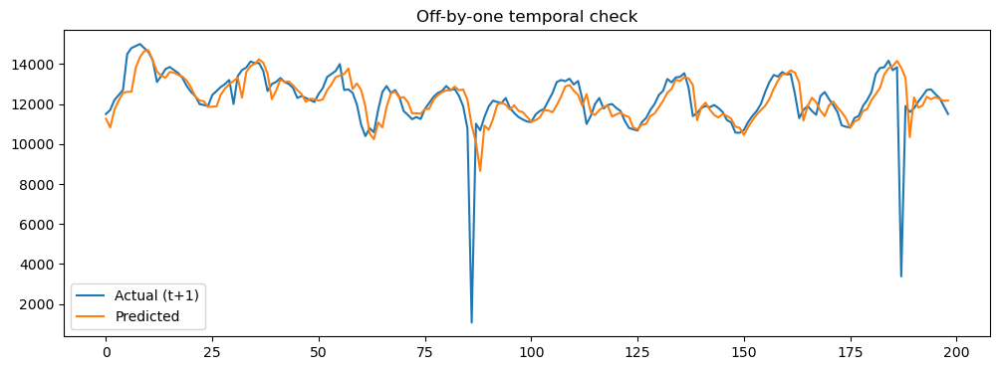

In [110]:
"""
Visualize the temporal alignment between actual and predicted values
This plot helps verify if there's a one-time-step offset in predictions
"""
plt.figure(figsize=(12,4))
# Plot actual values (starting from index 1 to avoid potential alignment issues)
plt.plot(y_test_original[1:200], label='Actual (t+1)')
# Plot predicted values (shifted by one time step to match actual values)
plt.plot(y_pred_original[:199], label='Predicted')
plt.legend()
plt.title('Off-by-one temporal check')
plt.show()

### Plot training history with insights

✓ Training history loaded from: ./model/training_history.pkl


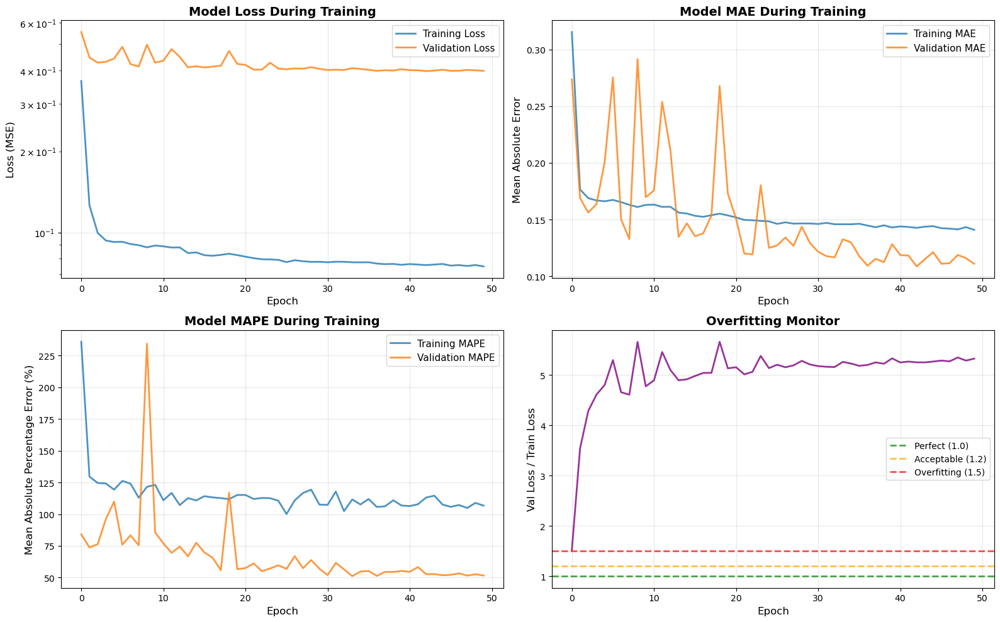


✓ Training history visualization completed


In [111]:
# Load training history if it exists
history_path = os.path.join(os.path.dirname(MODEL_PATH), 'training_history.pkl')
if os.path.exists(history_path):
    import pickle
    with open(history_path, 'rb') as f:
        history = pickle.load(f)
    print(f"✓ Training history loaded from: {history_path}")
else:
    print(f"⚠️  Training history not found at: {history_path}")
    print("  Using dummy history (plotting will be skipped)")
    history = None

if history is not None:
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))

    # Plot 1: Loss (log scale for better visibility)
    axes[0, 0].plot(history['loss'], label='Training Loss', linewidth=2, alpha=0.8)
    axes[0, 0].plot(history['val_loss'], label='Validation Loss', linewidth=2, alpha=0.8)
    axes[0, 0].set_xlabel('Epoch', fontsize=12)
    axes[0, 0].set_ylabel('Loss (MSE)', fontsize=12)
    axes[0, 0].set_title('Model Loss During Training', fontsize=14, fontweight='bold')
    axes[0, 0].legend(fontsize=11)
    axes[0, 0].grid(True, alpha=0.3)
    axes[0, 0].set_yscale('log')  # Log scale for better visibility

    # Plot 2: MAE
    axes[0, 1].plot(history['mae'], label='Training MAE', linewidth=2, alpha=0.8)
    axes[0, 1].plot(history['val_mae'], label='Validation MAE', linewidth=2, alpha=0.8)
    axes[0, 1].set_xlabel('Epoch', fontsize=12)
    axes[0, 1].set_ylabel('Mean Absolute Error', fontsize=12)
    axes[0, 1].set_title('Model MAE During Training', fontsize=14, fontweight='bold')
    axes[0, 1].legend(fontsize=11)
    axes[0, 1].grid(True, alpha=0.3)

    # Plot 3: MAPE (if available)
    if 'mape' in history:
        axes[1, 0].plot(history['mape'], label='Training MAPE', linewidth=2, alpha=0.8)
        axes[1, 0].plot(history['val_mape'], label='Validation MAPE', linewidth=2, alpha=0.8)
        axes[1, 0].set_xlabel('Epoch', fontsize=12)
        axes[1, 0].set_ylabel('Mean Absolute Percentage Error (%)', fontsize=12)
        axes[1, 0].set_title('Model MAPE During Training', fontsize=14, fontweight='bold')
        axes[1, 0].legend(fontsize=11)
        axes[1, 0].grid(True, alpha=0.3)
    else:
        axes[1, 0].text(0.5, 0.5, 'MAPE not available', 
                        ha='center', va='center', fontsize=14)
        axes[1, 0].axis('off')

    # Plot 4: Learning Rate (if available)
    if 'lr' in history:
        axes[1, 1].plot(history['lr'], label='Learning Rate', 
                        linewidth=2, alpha=0.8, color='orange')
        axes[1, 1].set_xlabel('Epoch', fontsize=12)
        axes[1, 1].set_ylabel('Learning Rate', fontsize=12)
        axes[1, 1].set_title('Learning Rate Schedule', fontsize=14, fontweight='bold')
        axes[1, 1].set_yscale('log')
        axes[1, 1].legend(fontsize=11)
        axes[1, 1].grid(True, alpha=0.3)
    else:
        # Plot overfitting analysis
        train_loss = np.array(history['loss'])
        val_loss = np.array(history['val_loss'])
        overfit_ratio = val_loss / train_loss
        
        axes[1, 1].plot(overfit_ratio, linewidth=2, alpha=0.8, color='purple')
        axes[1, 1].axhline(y=1.0, color='green', linestyle='--', 
                           linewidth=2, label='Perfect (1.0)', alpha=0.7)
        axes[1, 1].axhline(y=1.2, color='orange', linestyle='--', 
                           linewidth=2, label='Acceptable (1.2)', alpha=0.7)
        axes[1, 1].axhline(y=1.5, color='red', linestyle='--', 
                           linewidth=2, label='Overfitting (1.5)', alpha=0.7)
        axes[1, 1].set_xlabel('Epoch', fontsize=12)
        axes[1, 1].set_ylabel('Val Loss / Train Loss', fontsize=12)
        axes[1, 1].set_title('Overfitting Monitor', fontsize=14, fontweight='bold')
        axes[1, 1].legend(fontsize=10)
        axes[1, 1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    print("\n✓ Training history visualization completed")
else:
    print("⚠️  No training history available for plotting")

### Dynamic visualization - historical data + forecast

In [139]:
"""
Visualizes the transition from historical data to forecast using Plotly.
Interactive visualization with dynamic zoom and pan capabilities.

Parameters:
- PREDICTION_POINTS: How many future points to forecast (already defined)
- SHOW_LAST_DATA: How many PREDICTION_POINTS to show as historical data before forecast
  Example: SHOW_LAST_DATA = 5 means show last 5×PREDICTION_POINTS historical points
"""

import plotly.graph_objects as go
import numpy as np


def plot_forecast_with_context_plotly(
    wave_df,
    X_train,
    y_test_original,
    y_pred_original,
    sequence_length,
    prediction_points,
    mae,
    show_last_data=4,
    width=1400,
    height=600
):
    """
    Create interactive Plotly visualization showing historical context and LSTM forecast.
    
    Parameters
    ----------
    wave_df : DataFrame
        DataFrame containing 'target' column with original signal
    X_train : array-like
        Training sequences
    y_test_original : array-like
        Actual test values (unscaled)
    y_pred_original : array-like
        Model predictions (unscaled)
    sequence_length : int
        LSTM sequence length
    prediction_points : int
        Number of forecast points to display
    mae : float
        Mean Absolute Error for confidence band
    show_last_data : int, optional
        Multiplier for historical window (default: 4)
    width : int, optional
        Figure width in pixels (default: 1400)
    height : int, optional
        Figure height in pixels (default: 600)
        
    Returns
    -------
    plotly.graph_objects.Figure
        Interactive Plotly figure
    """
    
    train_size = len(X_train)
    test_start_idx = train_size + sequence_length
    
    # Get original signal from wave_df (before scaling)
    original_signal = wave_df['target'].values
    
    # For time axis, create indices
    time_indices = np.arange(len(original_signal))
    
    # Calculate indices for predictions
    pred_start_idx = test_start_idx
    pred_end_idx = pred_start_idx + len(y_pred_original)
    
    # Time indices for predictions
    time_pred = time_indices[pred_start_idx:pred_end_idx]
    
    # Calculate total data points
    total_samples = len(original_signal)
    test_samples = len(y_test_original)
    
    # Test predictions start at the end minus test_samples
    test_start_idx = total_samples - test_samples
    
    # Calculate indices for visualization
    historical_points = prediction_points * show_last_data
    
    # Ensure we have enough historical data
    if test_start_idx < historical_points:
        historical_points = test_start_idx
        print(f"⚠️  Warning: Not enough historical data for {show_last_data} windows")
        print(f"   Showing available {historical_points} points instead")
    
    # Start of historical window
    hist_start_idx = test_start_idx - historical_points
    
    # Indices for historical data
    time_historical = np.arange(hist_start_idx, test_start_idx)
    
    # Indices for forecast
    time_forecast = np.arange(test_start_idx, test_start_idx + min(prediction_points, len(y_pred_original)))
    
    # Get the data
    historical_data = original_signal[hist_start_idx:test_start_idx]
    forecast_data = y_pred_original[:len(time_forecast)]
    actual_forecast = original_signal[test_start_idx:test_start_idx + len(time_forecast)]
    
    # Create the Plotly figure
    fig = go.Figure()
    
    # Add shaded regions (add first so they're in background)
    fig.add_vrect(
        x0=hist_start_idx, x1=test_start_idx,
        fillcolor="gray", opacity=0.05,
        layer="below", line_width=0,
        annotation_text="HISTORICAL", 
        annotation_position="top",
        annotation=dict(font_size=14, font_color="gray", font_weight="bold")
    )
    
    fig.add_vrect(
        x0=test_start_idx, x1=time_forecast[-1],
        fillcolor="lightblue", opacity=0.05,
        layer="below", line_width=0,
        annotation_text=f"FORECAST<br>(Next {len(forecast_data):,}h)", 
        annotation_position="top",
        annotation=dict(font_size=14, font_color="#2E86DE", font_weight="bold")
    )
    
    # Plot HISTORICAL data (gray line)
    fig.add_trace(go.Scatter(
        x=time_historical,
        y=historical_data,
        mode='lines',
        name=f'Historical Data (Last {len(historical_data):,} points)',
        line=dict(color='gray', width=1.5),
        opacity=0.7,
        hovertemplate='<b>Historical</b><br>Time: %{x}<br>Demand: %{y:.2f} MW<extra></extra>'
    ))
    
    # Plot ACTUAL values for forecast period (black line)
    fig.add_trace(go.Scatter(
        x=time_forecast,
        y=actual_forecast,
        mode='lines',
        name='Actual (Test Period)',
        line=dict(color='black', width=2.5),
        opacity=0.9,
        hovertemplate='<b>Actual</b><br>Time: %{x}<br>Demand: %{y:.2f} MW<extra></extra>'
    ))
    
    # Add confidence band (upper bound)
    fig.add_trace(go.Scatter(
        x=time_forecast,
        y=forecast_data + mae,
        mode='lines',
        name='Upper Confidence',
        line=dict(width=0),
        showlegend=False,
        hoverinfo='skip'
    ))
    
    # Add confidence band (lower bound) - this creates the filled area
    fig.add_trace(go.Scatter(
        x=time_forecast,
        y=forecast_data - mae,
        mode='lines',
        name=f'±{mae:.1f} MW Confidence Band',
        line=dict(width=0),
        fillcolor='rgba(46, 134, 222, 0.2)',
        fill='tonexty',
        hovertemplate=f'<b>Confidence Band</b><br>±{mae:.1f} MW<extra></extra>'
    ))
    
    # Plot PREDICTIONS (blue with markers)
    fig.add_trace(go.Scatter(
        x=time_forecast,
        y=forecast_data,
        mode='lines+markers',
        name=f'Forecast (Next {len(forecast_data):,} points)',
        line=dict(color='#2E86DE', width=2.5),
        marker=dict(size=4, color='#2E86DE'),
        opacity=0.85,
        hovertemplate='<b>Forecast</b><br>Time: %{x}<br>Demand: %{y:.2f} MW<extra></extra>'
    ))
    
    # Mark the transition point
    fig.add_vline(
        x=test_start_idx,
        line_dash="dash",
        line_color="red",
        line_width=2.5,
        opacity=0.8,
        annotation_text="Forecast Start",
        annotation_position="top"
    )
    
    # Update layout
    total_training_points = len(X_train)
    fig.update_layout(
        title=dict(
            text=f'Electricity Demand: Historical Context + LSTM Forecast<br>'
                 f'<sub>Displaying {show_last_data}×{prediction_points:,} = {len(historical_data):,} '
                 f'historical hours (from {total_training_points:,} training points) + '
                 f'{len(forecast_data):,} forecast hours</sub>',
            x=0.5,
            xanchor='center',
            font=dict(size=18, color='black', family='Arial Black')
        ),
        xaxis=dict(
            title=dict(text='Time Index (Hours from Start)', font=dict(size=15, family='Arial Black')),
            showgrid=True,
            gridwidth=1,
            gridcolor='rgba(128, 128, 128, 0.2)',
            zeroline=False,
            rangeslider=dict(visible=True),
        ),
        yaxis=dict(
            title=dict(text='Demand (MW)', font=dict(size=15, family='Arial Black')),
            showgrid=True,
            gridwidth=1,
            gridcolor='rgba(128, 128, 128, 0.2)',
            zeroline=False
        ),
        hovermode='x unified',
        plot_bgcolor='#f8f9fa',
        paper_bgcolor='white',
        height=height,
        width=width,
        legend=dict(
            x=1.02,
            y=1,
            xanchor='left',
            yanchor='top',
            bgcolor='rgba(255, 255, 255, 0.95)',
            bordercolor='black',
            borderwidth=1,
            font=dict(size=11)
        ),
        margin=dict(l=80, r=200, t=120, b=80)
    )
    
    # Print summary
    _print_visualization_summary(
        original_signal, X_train, y_test_original, 
        historical_data, forecast_data, test_start_idx,
        show_last_data, prediction_points
    )
    
    return fig


def plot_detailed_forecast_comparison_plotly(
    y_test_original,
    y_pred_original,
    train_size,
    sequence_length,
    prediction_points,
    mae,
    width=1400,
    height=550
):
    """
    Create detailed interactive comparison plot of actual vs forecast values.
    
    Parameters
    ----------
    y_test_original : array-like
        Actual test values (unscaled)
    y_pred_original : array-like
        Model predictions (unscaled)
    train_size : int
        Number of training sequences
    sequence_length : int
        LSTM sequence length
    prediction_points : int
        Number of points to display
    mae : float
        Global MAE from entire test set for confidence band
    width : int, optional
        Figure width in pixels (default: 1400)
    height : int, optional
        Figure height in pixels (default: 550)
        
    Returns
    -------
    plotly.graph_objects.Figure
        Interactive Plotly figure
    """
    
    # Calculate time indices
    test_start_idx = train_size + sequence_length
    time_indices = np.arange(len(y_test_original))
    time_pred = time_indices + test_start_idx
    
    # Calculate display points
    n_points = min(prediction_points, len(y_pred_original))
    display_points = min(prediction_points, n_points)
    
    # Create figure
    fig = go.Figure()
    
    # Plot actual values
    fig.add_trace(go.Scatter(
        x=time_pred[:display_points],
        y=y_test_original[:display_points],
        mode='lines+markers',
        name='Actual',
        line=dict(color='black', width=2.5),
        marker=dict(
            size=5,
            color='white',
            line=dict(color='black', width=1.5)
        ),
        opacity=0.8,
        hovertemplate='<b>Actual</b><br>Time: %{x}<br>Demand: %{y:.2f} MW<extra></extra>'
    ))
    
    # Add confidence band (upper bound)
    fig.add_trace(go.Scatter(
        x=time_pred[:display_points],
        y=y_pred_original[:display_points] + mae,
        mode='lines',
        name='Upper Confidence',
        line=dict(width=0),
        showlegend=False,
        hoverinfo='skip'
    ))
    
    # Add confidence band (lower bound) - creates filled area
    fig.add_trace(go.Scatter(
        x=time_pred[:display_points],
        y=y_pred_original[:display_points] - mae,
        mode='lines',
        name=f'±{mae:.1f} MW Confidence Band',
        line=dict(width=0),
        fillcolor='rgba(46, 134, 222, 0.2)',
        fill='tonexty',
        hovertemplate=f'<b>Confidence Band</b><br>±{mae:.1f} MW<extra></extra>'
    ))
    
    # Plot predictions
    fig.add_trace(go.Scatter(
        x=time_pred[:display_points],
        y=y_pred_original[:display_points],
        mode='lines+markers',
        name='Forecast',
        line=dict(color='#2E86DE', width=2.5),
        marker=dict(size=4, color='#2E86DE', symbol='square'),
        opacity=0.85,
        hovertemplate='<b>Forecast</b><br>Time: %{x}<br>Demand: %{y:.2f} MW<extra></extra>'
    ))
    
    # Add error bars (every 5th point)
    for i in range(0, display_points, 5):
        fig.add_trace(go.Scatter(
            x=[time_pred[i], time_pred[i]],
            y=[y_test_original[i], y_pred_original[i]],
            mode='lines',
            line=dict(color='red', width=1),
            opacity=0.3,
            showlegend=False,
            hoverinfo='skip'
        ))
    
    # Update layout
    fig.update_layout(
        title=dict(
            text=f'Detailed View: Actual vs Forecast (First {display_points} predictions)<br>'
                 f'<sub>Global MAE: {mae:.2f} MW (from entire test set)</sub>',
            x=0.5,
            xanchor='center',
            font=dict(size=18, color='black', family='Arial Black')
        ),
        xaxis=dict(
            title=dict(text='Time Step (Hours)', font=dict(size=15, family='Arial Black')),
            showgrid=True,
            gridwidth=1,
            gridcolor='rgba(128, 128, 128, 0.2)',
            zeroline=False,
            rangeslider=dict(visible=True),
        ),
        yaxis=dict(
            title=dict(text='Demand (MW)', font=dict(size=15, family='Arial Black')),
            showgrid=True,
            gridwidth=1,
            gridcolor='rgba(128, 128, 128, 0.2)',
            zeroline=False
        ),
        hovermode='x unified',
        plot_bgcolor='#f8f9fa',
        paper_bgcolor='white',
        height=height,
        width=width,
        legend=dict(
            x=1.02,
            y=1,
            xanchor='left',
            yanchor='top',
            bgcolor='rgba(255, 255, 255, 0.95)',
            bordercolor='black',
            borderwidth=1,
            font=dict(size=11)
        ),
        margin=dict(l=80, r=200, t=100, b=80)
    )
    
    return fig


def _print_visualization_summary(
    original_signal,
    X_train,
    y_test_original,
    historical_data,
    forecast_data,
    test_start_idx,
    show_last_data,
    prediction_points
):
    """Print detailed summary of visualization configuration."""
    
    print("\n" + "="*80)
    print("📊 VISUALIZATION SUMMARY")
    print("="*80)
    
    # Dataset overview
    print(f"\n🔢 DATASET OVERVIEW:")
    print(f"   • Total dataset size: {len(original_signal):,} hours")
    print(f"   • Training set size: {len(X_train):,} sequences (used to train LSTM)")
    print(f"   • Test set size: {len(y_test_original):,} hours")
    
    # Visualization window explanation
    print(f"\n🪟 VISUALIZATION WINDOW:")
    print(f"   • Configuration: SHOW_LAST_DATA = {show_last_data}")
    print(f"   • Formula: {show_last_data} × {prediction_points:,} = {len(historical_data):,} historical hours shown")
    print(f"   • Why partial view? To maintain visual clarity while showing recent context")
    print(f"   • Historical data shown: LAST {len(historical_data):,} hours before forecast")
    print(f"   • Historical data NOT shown: {test_start_idx - len(historical_data):,} earlier hours")
    
    # Forecast details
    print(f"\n🔮 FORECAST DETAILS:")
    print(f"   • Forecasting horizon: {len(forecast_data):,} hours ahead")
    print(f"   • Forecast start index: {test_start_idx:,} hours from dataset start")
    print(f"   • Total points in visualization: {len(historical_data) + len(forecast_data):,} hours")
    
    # Performance context
    print(f"\n📈 CONTEXT:")
    print(f"   • Model was trained on {len(X_train):,} sequences")
    print(f"   • Visualization shows {(len(historical_data)/test_start_idx)*100:.1f}% of historical data before forecast")
    print(f"   • This provides {show_last_data} full forecast-window cycles of context")
    
    print("\n" + "="*80 + "\n")


# =============================================================================
# MAIN EXECUTION CODE (HOW TO USE THE FUNCTIONS)
# =============================================================================

# Configuration
SHOW_LAST_DATA = 4  # Show last X forecast windows of historical data

# NOTE ON MAE (Mean Absolute Error):
# Global MAE is calculated from the ENTIRE test set (all predictions)
# This same Global MAE is used consistently in both plots for:
#   1. Visual confidence band (±MAE shaded area)
#   2. Numeric MAE value (in legend and title)
#
# Example:
#   mae = mean_absolute_error(y_test_original, y_pred_original)
#   This uses ALL test predictions, not just the visualization window

# Create main visualization with historical context
fig1 = plot_forecast_with_context_plotly(
    wave_df=wave_df,
    X_train=X_train,
    y_test_original=y_test_original,
    y_pred_original=y_pred_original,
    sequence_length=SEQUENCE_LENGTH,
    prediction_points=PREDICTION_POINTS,
    mae=mae,
    show_last_data=SHOW_LAST_DATA,
    width=1400,
    height=600
)

# Show the figure
fig1.show()

# Create detailed comparison view
fig2 = plot_detailed_forecast_comparison_plotly(
    y_test_original=y_test_original,
    y_pred_original=y_pred_original,
    train_size=len(X_train),
    sequence_length=SEQUENCE_LENGTH,
    prediction_points=PREDICTION_POINTS,
    mae=mae,  # Pass global MAE for consistency
    width=1400,
    height=550
)

# Show the detailed figure
fig2.show()


📊 VISUALIZATION SUMMARY

🔢 DATASET OVERVIEW:
   • Total dataset size: 92,649 hours
   • Training set size: 74,119 sequences (used to train LSTM)
   • Test set size: 18,362 hours

🪟 VISUALIZATION WINDOW:
   • Configuration: SHOW_LAST_DATA = 4
   • Formula: 4 × 336 = 1,344 historical hours shown
   • Why partial view? To maintain visual clarity while showing recent context
   • Historical data shown: LAST 1,344 hours before forecast
   • Historical data NOT shown: 72,943 earlier hours

🔮 FORECAST DETAILS:
   • Forecasting horizon: 336 hours ahead
   • Forecast start index: 74,287 hours from dataset start
   • Total points in visualization: 1,680 hours

📈 CONTEXT:
   • Model was trained on 74,119 sequences
   • Visualization shows 1.8% of historical data before forecast
   • This provides 4 full forecast-window cycles of context




### Visualize input windows (x_test)

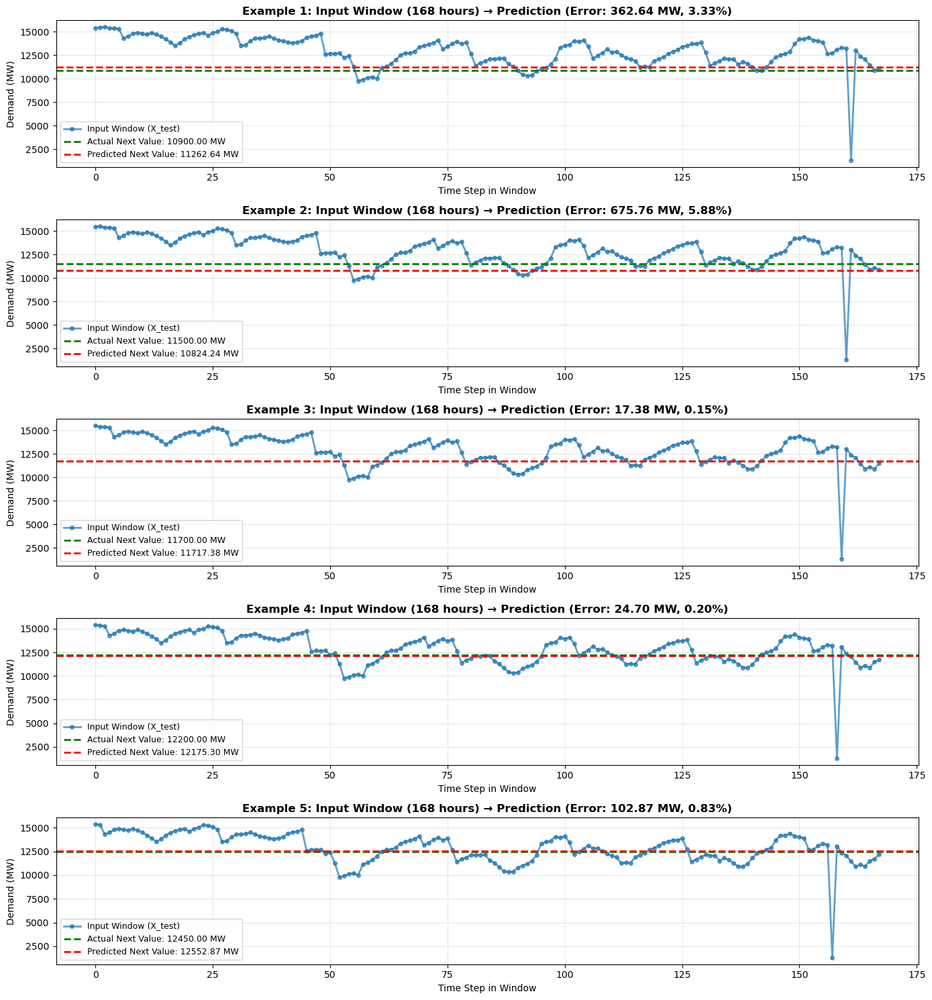

In [115]:
# Show a few example input sequences and their predictions
"""
Visualize input windows and their corresponding predictions

This function displays example input sequences from the test set along with their actual 
and predicted values. It helps to understand how well the model performs on individual 
examples by showing the input window (sequence of past values) and comparing it with 
the actual next value and the model's prediction.

Parameters:
- n_examples: Number of windows to display (default: 5)
- X_test_seq_scaled: Scaled input sequences from test set
- y_test_original: Actual values from test set (original scale)
- y_pred_original: Predicted values from test set (original scale)
- scaler: Scaler object used for inverse transformation (if scaling was applied)
- SEQUENCE_LENGTH: Length of input sequences

The visualization shows:
1. Input window (past values) in blue
2. Actual next value as a green dashed line
3. Predicted next value as a red dashed line
4. Error metrics (absolute error and percentage error)
"""

n_examples = 5  # Number of windows to show

fig, axes = plt.subplots(n_examples, 1, figsize=(14, 3*n_examples))

for i in range(n_examples):
    if i >= len(X_test_seq_scaled):
        break
    
    # Get the input sequence (window)
    window = X_test_seq_scaled[i]  # Shape: (SEQUENCE_LENGTH, n_features)
    
    # Since we have 1 feature (signal), extract it
    window_values = window[:, 0]  # Get the signal feature values
    
    # Inverse transform window to original scale
    if SCALE_DATA and scaler is not None:
        window_original = scaler.inverse_transform(window_values.reshape(-1, 1)).flatten()
    else:
        window_original = window_values
    
    # Get actual and predicted values (already in original scale)
    actual = y_test_original[i]
    predicted = y_pred_original[i]
    
    # Plot the window
    axes[i].plot(range(SEQUENCE_LENGTH), window_original, 'o-', 
                linewidth=2, markersize=4, label='Input Window (X_test)', alpha=0.7)
    
    # Mark the prediction point
    axes[i].axhline(y=actual, color='green', linestyle='--', 
                   linewidth=2, label=f'Actual Next Value: {actual:.2f} MW')
    axes[i].axhline(y=predicted, color='red', linestyle='--', 
                   linewidth=2, label=f'Predicted Next Value: {predicted:.2f} MW')
    
    # Calculate error
    error = abs(actual - predicted)
    error_pct = (error / actual) * 100
    
    axes[i].set_xlabel('Time Step in Window', fontsize=10)
    axes[i].set_ylabel('Demand (MW)', fontsize=10)
    axes[i].set_title(f'Example {i+1}: Input Window ({SEQUENCE_LENGTH} hours) → Prediction (Error: {error:.2f} MW, {error_pct:.2f}%)', 
                     fontsize=12, fontweight='bold')
    axes[i].legend(fontsize=9, loc='best')
    axes[i].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## 14. Error Analysis

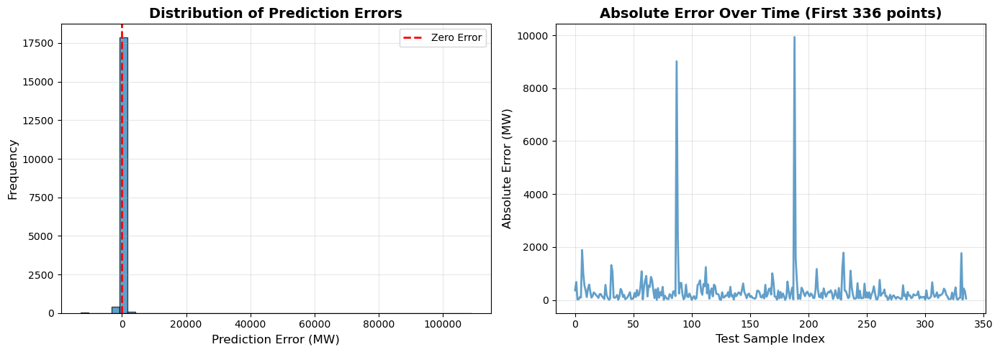


WORKFLOW COMPLETED SUCCESSFULLY! 🎉

Model Performance Metrics:
Mean Absolute Error (MAE): 320.21 MW
Root Mean Square Error (RMSE): 1456.82 MW
Mean Absolute Percentage Error (MAPE): 3.95%

Key Insights:
  ✅ Model performance is excellent (MAPE < 5%)

Recommendations:
  • Model performance is satisfactory
  • Consider further optimization if needed


In [117]:
# Calculate prediction errors in ORIGINAL MW SCALE
errors = y_test_original - y_pred_original
abs_errors = np.abs(errors)

# Limit number of points for visualization
n_points = min(PREDICTION_POINTS, len(y_pred_original))

plt.figure(figsize=(14, 5))

# >>> Error distribution <<<

plt.subplot(1, 2, 1)
plt.hist(errors, bins=50, edgecolor='black', alpha=0.7)
plt.xlabel('Prediction Error (MW)', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.title('Distribution of Prediction Errors', fontsize=14, fontweight='bold')
plt.axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero Error')
plt.legend()
plt.grid(True, alpha=0.3)

# >>> Absolute error over time <<<

plt.subplot(1, 2, 2)
plt.plot(abs_errors[:n_points], linewidth=2, alpha=0.7)
plt.xlabel('Test Sample Index', fontsize=12)
plt.ylabel('Absolute Error (MW)', fontsize=12)
plt.title(f'Absolute Error Over Time (First {n_points} points)', 
          fontsize=14, fontweight='bold')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Calculate and display key performance metrics
mae = np.mean(abs_errors)
rmse = np.sqrt(np.mean(errors**2))
mape = np.mean(np.abs(errors / y_test_original)) * 100

print("\n" + "="*70)
print("WORKFLOW COMPLETED SUCCESSFULLY! 🎉")
print("="*70)
print(f"\nModel Performance Metrics:")
print(f"Mean Absolute Error (MAE): {mae:.2f} MW")
print(f"Root Mean Square Error (RMSE): {rmse:.2f} MW")
print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")
print(f"\nKey Insights:")
if mape < 5:
    print("  ✅ Model performance is excellent (MAPE < 5%)")
elif mape < 10:
    print("  ✅ Model performance is good (5% ≤ MAPE < 10%)")
elif mape < 20:
    print("  ⚠️  Model performance is acceptable (10% ≤ MAPE < 20%)")
else:
    print("  ❌ Model performance needs improvement (MAPE ≥ 20%)")

print(f"\nRecommendations:")
if mape > 10:
    print("  • Consider increasing SEQUENCE_LENGTH to 336 (2 weeks)")
    print("  • Add external features (temperature, holidays, day of week)")
    print("  • Experiment with different architectures")
else:
    print("  • Model performance is satisfactory")
    print("  • Consider further optimization if needed")
    
print("="*70)